# Unified SAM + Visual Encoder + Object Tracking Pipeline

This notebook provides a unified interface for:
- **SAM**: SAM 1 or SAM 2 segmentation
- **Visual Encoders**: DINOv2 or NaRadIO
- **Captions**: Optional Florence-2 descriptions
- **Zero-shot**: Optional NaRadIO category classification
- **Matching**: Greedy or Hungarian algorithm for object tracking
- **Metrics**: Unsupervised quality evaluation

## 1. Imports

In [1]:
import sys
from pathlib import Path
from tqdm.auto import tqdm

import torch
import numpy as np
np.random.seed(0xDEADBEEF)
import matplotlib.pyplot as plt
from PIL import Image

# Add src to path
src_dir = Path.cwd()
if str(src_dir) not in sys.path:
    sys.path.insert(0, str(src_dir))

# Import our modules
from utils.visualization import (show_anns, visualize_masks_with_descriptions,
                                 visualize_object_tracking_with_metrics)
from utils.matching import greedy_match_objects, optimal_match_objects
from utils.metrics import compute_unsupervised_metrics
from encoders.florence import load_florence_model
from encoders.dinov2 import load_dinov2_model
from encoders.naradio import load_naradio_encoder
from segmentation.sam import init_sam
from processing import process_masks_with_features

# Device selection
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")

if device.type == "cuda":
    torch.autocast("cuda", dtype=torch.float16).__enter__()

Using device: cuda


## 2. Configuration

Customize your pipeline here:

In [2]:
# ========== PROJECT PATHS ==========
projectDir = Path.cwd().parent
dataDir = projectDir / "data/scand_spot_fountain-lib/output_frames"

# ========== SAM CONFIGURATION ==========
SAM_CONFIG = {
    'version': 'sam1',  # 'sam1' or 'sam2'
    'checkpoint_path': "/mnt/vol0/weights/sam/sam_vit_h_4b8939.pth",
    'model_type': 'vit_h',  # SAM 1 only: 'vit_h', 'vit_l', 'vit_b'
    'points_per_side': 4,   # Number of grid points per side
    'pred_iou_thresh': 0.95,  # IoU threshold for mask quality
}

# ========== ENCODER CONFIGURATION ==========
ENCODER_CONFIG = {
    'type': 'naradio',  # 'dinov2' or 'naradio'
    
    # DINOv2 settings
    'dinov2_model': 'facebook/dinov2-base',
    
    # NaRadIO settings
    'naradio_version': 'radio_v2.5-b',  # 'radio_v2.5-b', 'radio_v2.5-l', 'radio_v2.5-g'
    'naradio_lang_model': 'siglip',  # 'clip' or 'siglip'
    'naradio_resolution': (512, 512),
}

# ========== FLORENCE-2 CONFIGURATION ==========
FLORENCE_CONFIG = {
    'use_florence': True,  # Enable Florence-2 captions
    'model_name': 'microsoft/Florence-2-large-ft',
}

# ========== ZERO-SHOT CONFIGURATION (NaRadIO only) ==========
ZERO_SHOT_CONFIG = {
    'use_zero_shot': False,  # Enable NaRadIO zero-shot classification
    'labels': [
        "person", "building", "tree", "grass", "sky", "ground",
        "column", "statue", "bench", "wall", "window", "door",
        "car", "bicycle", "road", "path", "water", "fountain"
    ]
}

# ========== PROCESSING CONFIGURATION ==========
PROCESSING_CONFIG = {
    'use_batch': False,  # Batch processing for embeddings
    'batch_size': 8,
}

# ========== MATCHING CONFIGURATION ==========
MATCHING_CONFIG = {
    'algorithm': 'hungarian',  # 'greedy' or 'hungarian'
    'threshold': 0.7,  # Similarity threshold
}

# ========== DATA CONFIGURATION ==========
DATA_CONFIG = {
    'max_frames': 3,  # Maximum number of frames to process
}

print("Configuration loaded!")
print(f"  SAM: {SAM_CONFIG['version']}")
print(f"  Encoder: {ENCODER_CONFIG['type']}")
print(f"  Florence-2: {FLORENCE_CONFIG['use_florence']}")
print(f"  Zero-shot: {ZERO_SHOT_CONFIG['use_zero_shot']}")
print(f"  Matching: {MATCHING_CONFIG['algorithm']}")

Configuration loaded!
  SAM: sam1
  Encoder: naradio
  Florence-2: True
  Zero-shot: False
  Matching: hungarian


## 3. Model Initialization

In [3]:
# Initialize SAM
print("Loading SAM...")
mask_generator = init_sam(
    projectDir,
    version=SAM_CONFIG['version'],
    checkpoint_path=SAM_CONFIG['checkpoint_path'],
    model_type=SAM_CONFIG.get('model_type', 'vit_h'),
    points_per_side=SAM_CONFIG.get('points_per_side', 32),
    pred_iou_thresh=SAM_CONFIG.get('pred_iou_thresh', 0.88),
    device=str(device)
)
print("SAM loaded!")

Loading SAM...


/home/denis_fatykhov/Projects/vizEnc/segment-anything/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


SAM loaded!


In [4]:
# Initialize Florence-2 (if enabled)
florence_model, florence_processor = None, None
if FLORENCE_CONFIG['use_florence']:
    print("Loading Florence-2...")
    florence_model, florence_processor = load_florence_model(
        model_name=FLORENCE_CONFIG['model_name'],
        device=str(device),
        dtype=torch.float16
    )
    print("Florence-2 loaded!")

Loading Florence-2...


<unknown>:515: SyntaxWarning: invalid escape sequence '\d'


Florence-2 loaded!


In [5]:
# Initialize Visual Encoder
print(f"Loading {ENCODER_CONFIG['type'].upper()} encoder...")

if ENCODER_CONFIG['type'] == 'dinov2':
    visual_encoder, visual_processor = load_dinov2_model(
        model_name=ENCODER_CONFIG['dinov2_model'],
        device=str(device)
    )
    visual_device = device
    
elif ENCODER_CONFIG['type'] == 'naradio':
    visual_encoder = load_naradio_encoder(
        projectDir,
        input_resolution=ENCODER_CONFIG['naradio_resolution'],
        model_version=ENCODER_CONFIG['naradio_version'],
        lang_model=ENCODER_CONFIG['naradio_lang_model'],
        device=str(device)
    )
    visual_processor = None  # NaRadIO doesn't use separate processor
    visual_device = device
    
else:
    raise ValueError(f"Unknown encoder type: {ENCODER_CONFIG['type']}")

print(f"{ENCODER_CONFIG['type'].upper()} encoder loaded!")

ROS2 modules not found !


Loading NARADIO encoder...


/home/denis_fatykhov/Projects/vizEnc/RayFronts/rayfronts/image_encoders/naclip/clip_utils/clip.py:12: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import packaging
Unable to import openvdb. Make sure you compiled it. Will not import mappers that depend on it.
ROS2 modules not found !
Using cache found in /home/denis_fatykhov/.cache/torch/hub/NVlabs_RADIO_main


NARADIO encoder loaded!


## 4. Frame Processing

In [6]:
# Load frame paths
frames = sorted(dataDir.glob("frame_*.png"))
print(f"Found {len(frames)} frames")

Found 47 frames



Processing frame 1: frame_000001_t0.333.png


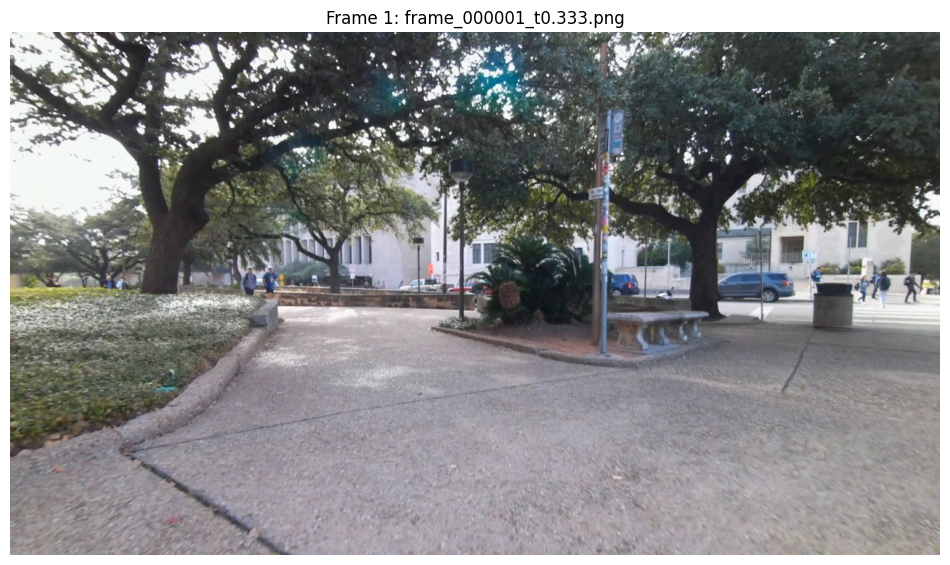

Generating masks...
Generated 6 masks


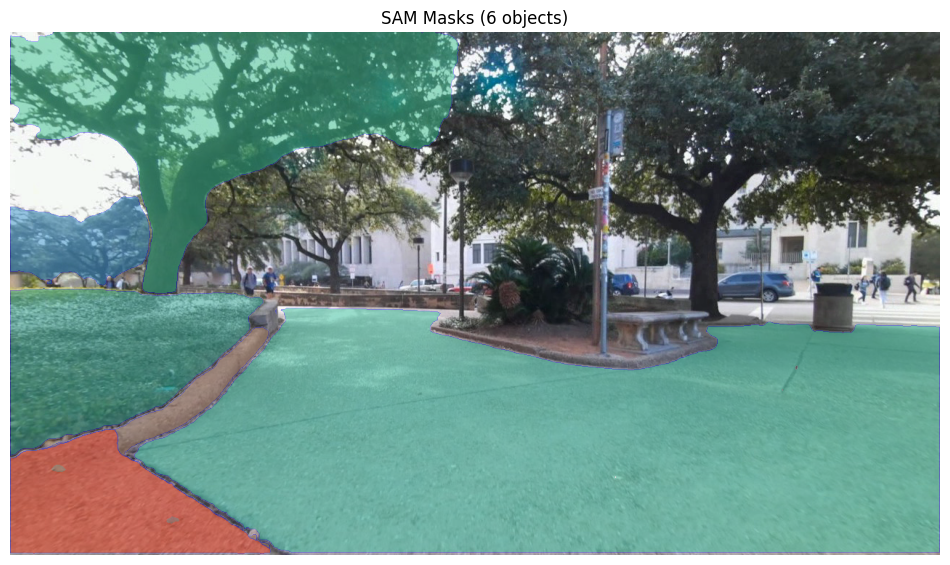

Generating descriptions...


  0%|          | 0/6 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/6 [00:00<?, ?it/s]

W0122 16:26:41.066000 126015587243840 torch/fx/experimental/symbolic_shapes.py:4449] [0/0] yindex is not in var_ranges, defaulting to unknown range.


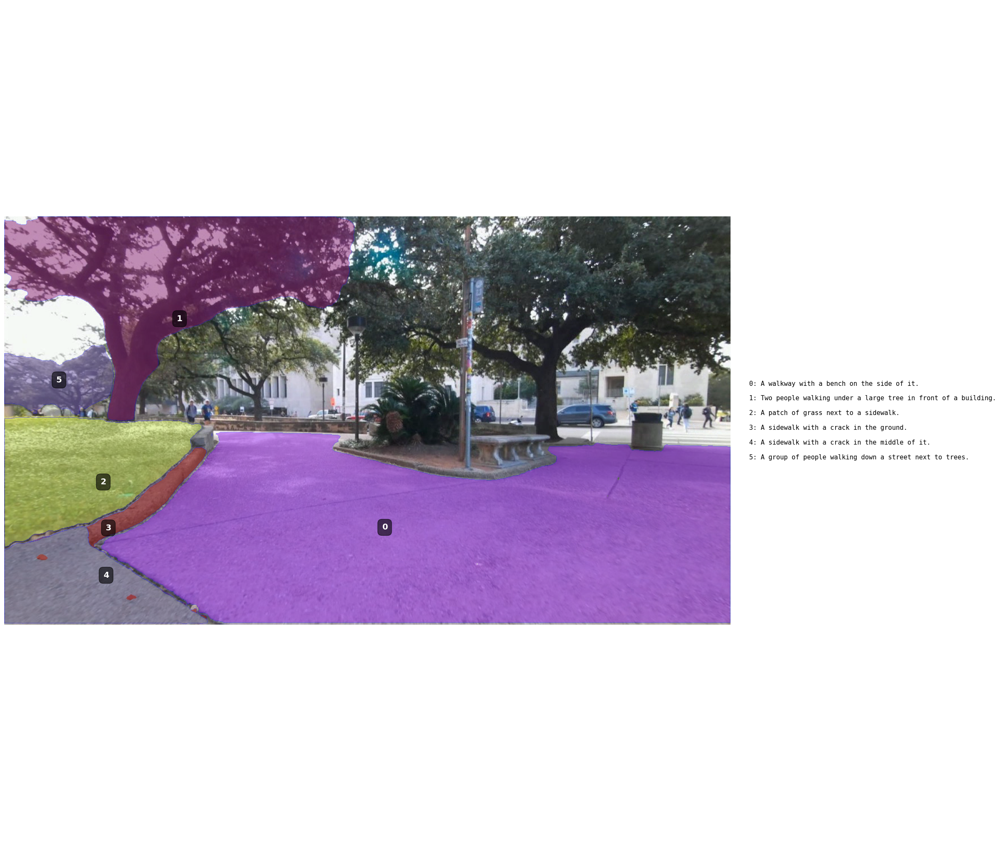


Processing frame 2: frame_000002_t0.667.png


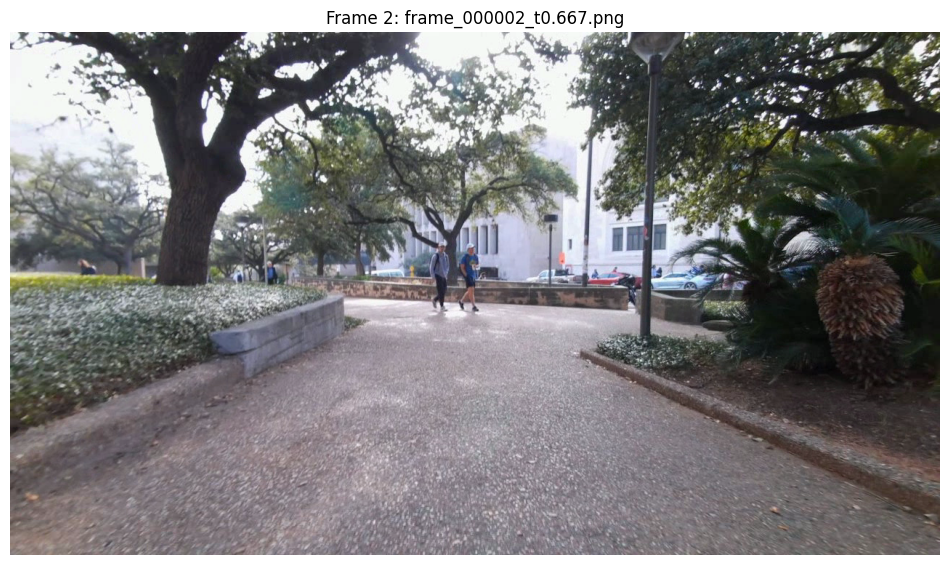

Generating masks...
Generated 7 masks


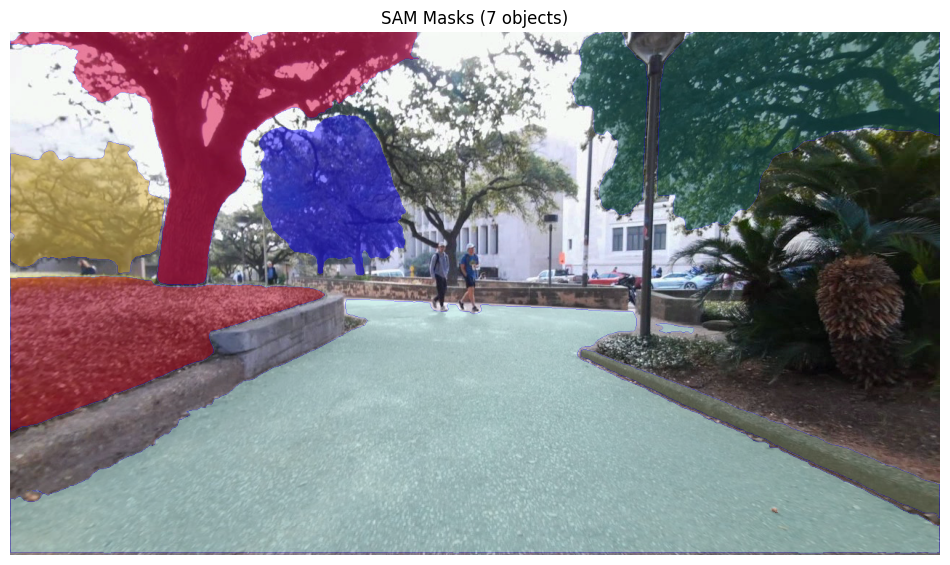

Generating descriptions...


  0%|          | 0/7 [00:00<?, ?it/s]

Extracting embeddings...


  0%|          | 0/7 [00:00<?, ?it/s]

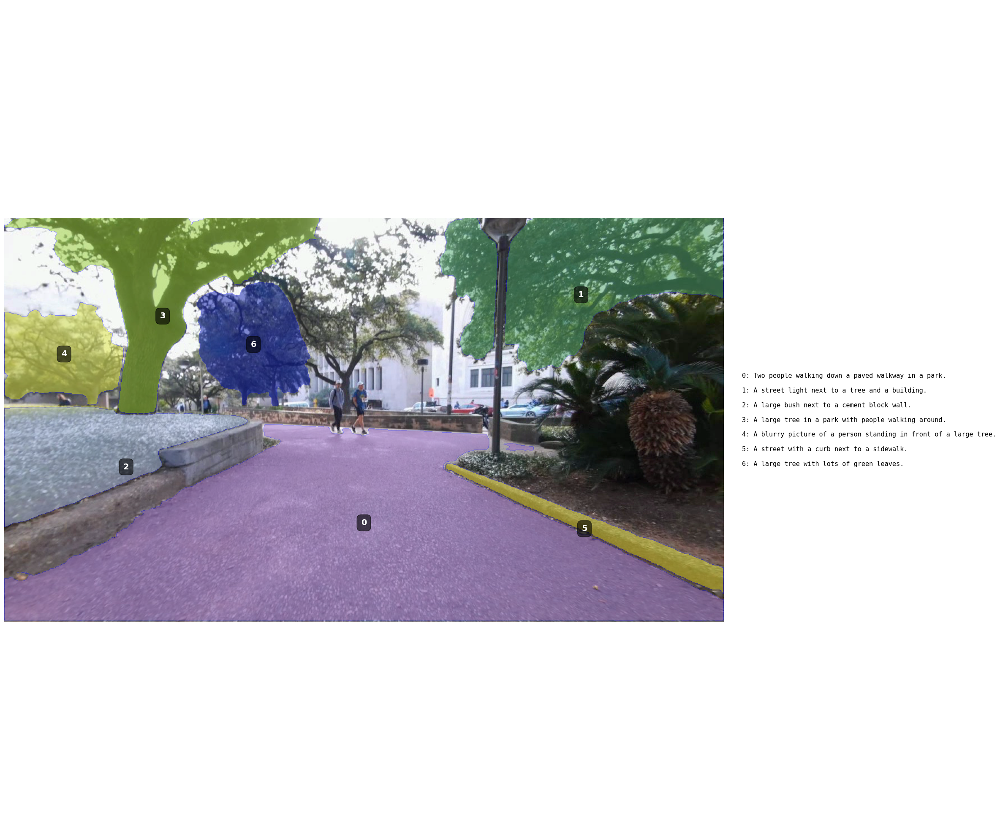


Processed 2 frames!


In [7]:
# Process frames
mask_db = []

# Build processing config
processing_config = {
    'encoder': ENCODER_CONFIG['type'],
    'use_florence': FLORENCE_CONFIG['use_florence'],
    'use_zero_shot': ZERO_SHOT_CONFIG['use_zero_shot'] and ENCODER_CONFIG['type'] == 'naradio',
    'zero_shot_labels': ZERO_SHOT_CONFIG['labels'],
    'use_batch': PROCESSING_CONFIG['use_batch'],
    'batch_size': PROCESSING_CONFIG['batch_size'],
}

# Build models dict
models = {
    'florence_model': florence_model,
    'florence_processor': florence_processor,
    'florence_device': device,
    'visual_encoder': visual_encoder,
    'visual_processor': visual_processor,
    'visual_device': visual_device,
}

for index, frame_path in enumerate(frames):
    if index == 0: continue
    if index >= DATA_CONFIG['max_frames']:
        break
        
    print(f"\n{'='*60}")
    print(f"Processing frame {index}: {frame_path.name}")
    print(f"{'='*60}")
    
    # Load image
    image = Image.open(frame_path).convert("RGB")
    
    # Display image
    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Frame {index}: {frame_path.name}")
    plt.show()
    
    # Generate masks
    print("Generating masks...")
    masks = mask_generator.generate(np.array(image))
    print(f"Generated {len(masks)} masks")
    
    # Display masks
    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    show_anns(masks)
    plt.axis('off')
    plt.title(f"SAM Masks ({len(masks)} objects)")
    plt.show()
    
    # Process masks with features
    masks = process_masks_with_features(image, masks, processing_config, models)
    
    # Visualize with descriptions
    visualize_masks_with_descriptions(image, masks)
    
    # Save to database
    mask_db.append((frame_path.name, masks))

print(f"\nProcessed {len(mask_db)} frames!")

## 5. Object Matching & Tracking

Frame 0: 6 objects
Frame 1: 7 objects
Embedding dimension: 768

HUNGARIAN MATCHING RESULTS
Matches found: 5
Average similarity: 0.928
Match rate: 0.769
Spatial consistency: 0.000
Average displacement: 202.3 px
Confidence score: 0.711
Unmatched frame0: 1, frame1: 2

Matches:
  Frame0[0] -> Frame1[0]: 0.904
    'A walkway with a bench on the side of it.' -> 'Two people walking down a paved walkway in a park.'
  Frame0[1] -> Frame1[3]: 0.963
    'Two people walking under a large tree in front of a building.' -> 'A large tree in a park with people walking around.'
  Frame0[2] -> Frame1[2]: 0.944
    'A patch of grass next to a sidewalk.' -> 'A large bush next to a cement block wall.'
  Frame0[4] -> Frame1[5]: 0.893
    'A sidewalk with a crack in the middle of it.' -> 'A street with a curb next to a sidewalk.'
  Frame0[5] -> Frame1[4]: 0.936
    'A group of people walking down a street next to trees.' -> 'A blurry picture of a person standing in front of a large tree.'


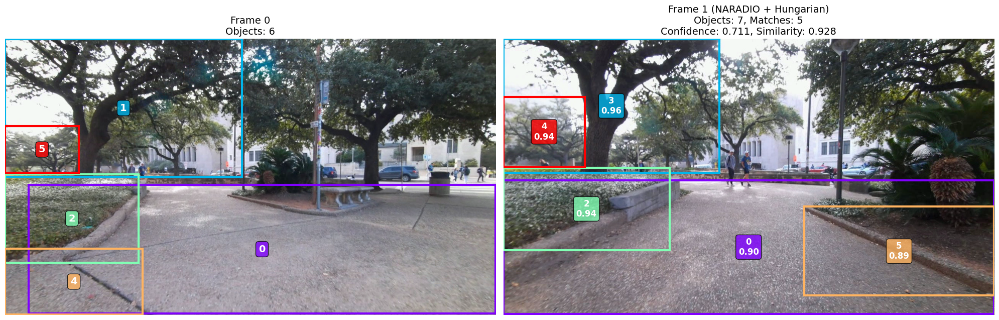

In [10]:
if len(mask_db) >= 2:
    # Extract embeddings
    frame0_embeddings = np.array([mask['embedding'] for mask in mask_db[0][1]])
    frame1_embeddings = np.array([mask['embedding'] for mask in mask_db[1][1]])
    
    frame0_bboxes = [m['bbox'] for m in mask_db[0][1]]
    frame1_bboxes = [m['bbox'] for m in mask_db[1][1]]
    
    print(f"Frame 0: {len(frame0_embeddings)} objects")
    print(f"Frame 1: {len(frame1_embeddings)} objects")
    print(f"Embedding dimension: {frame0_embeddings.shape[1]}")
    
    # Run matching
    if MATCHING_CONFIG['algorithm'] == 'hungarian':
        matches = optimal_match_objects(
            frame0_embeddings, frame1_embeddings,
            threshold=MATCHING_CONFIG['threshold']
        )
    else:
        matches = greedy_match_objects(
            frame0_embeddings, frame1_embeddings,
            threshold=MATCHING_CONFIG['threshold']
        )
    
    # Compute metrics
    metrics = compute_unsupervised_metrics(
        matches, frame0_embeddings, frame1_embeddings,
        frame0_bboxes, frame1_bboxes
    )
    
    # Print results
    print(f"\n{'='*60}")
    print(f"{MATCHING_CONFIG['algorithm'].upper()} MATCHING RESULTS")
    print(f"{'='*60}")
    print(f"Matches found: {metrics['n_matches']}")
    print(f"Average similarity: {metrics['avg_similarity']:.3f}")
    print(f"Match rate: {metrics['match_rate']:.3f}")
    print(f"Spatial consistency: {metrics['spatial_consistency']:.3f}")
    print(f"Average displacement: {metrics['avg_displacement']:.1f} px")
    print(f"Confidence score: {metrics['confidence_score']:.3f}")
    print(f"Unmatched frame0: {metrics['unmatched_f0']}, frame1: {metrics['unmatched_f1']}")
    
    print(f"\nMatches:")
    for i, j, sim in matches:
        print(f"  Frame0[{i}] -> Frame1[{j}]: {sim:.3f}")
        print(f"    '{mask_db[0][1][i]['description']}' -> '{mask_db[1][1][j]['description']}'")
    
    # Visualize tracking
    image0 = Image.open(frames[1]).convert("RGB")
    image1 = Image.open(frames[2]).convert("RGB")
    
    visualize_object_tracking_with_metrics(
        image0, mask_db[0][1],
        image1, mask_db[1][1],
        matches, metrics,
        title_suffix=f"({ENCODER_CONFIG['type'].upper()} + {MATCHING_CONFIG['algorithm'].capitalize()})"
    )
else:
    print("Need at least 2 frames for tracking!")

## 6. Embedding Analysis (Optional)

/home/denis_fatykhov/Projects/vizEnc/.venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/denis_fatykhov/Projects/vizEnc/.venv/lib/python3.12/site-packages/numba/np/ufunc/parallel.py:373: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/denis_fatykhov/Projects/vizEnc/.venv/lib/python3.12/site-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(


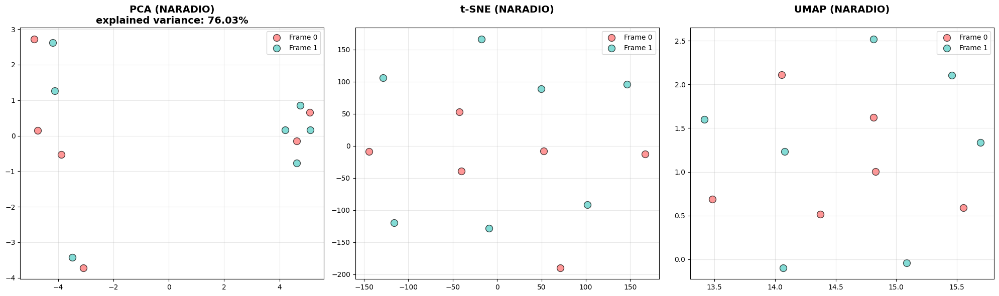

In [9]:
if len(mask_db) >= 2:
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE
    from umap import UMAP
    
    # Combine embeddings
    all_embeddings = np.vstack([frame0_embeddings, frame1_embeddings])
    labels = np.array([0] * len(frame0_embeddings) + [1] * len(frame1_embeddings))
    colors = ['#FF6B6B', '#4ECDC4']
    
    # Dimensionality reduction
    pca = PCA(n_components=2)
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(all_embeddings)-1))
    umap_reducer = UMAP(n_components=2, random_state=42)
    
    embeddings_pca = pca.fit_transform(all_embeddings)
    embeddings_tsne = tsne.fit_transform(all_embeddings)
    embeddings_umap = umap_reducer.fit_transform(all_embeddings)
    
    # Visualization
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    
    methods = [
        (embeddings_pca, 'PCA', f'explained variance: {pca.explained_variance_ratio_.sum():.2%}'),
        (embeddings_tsne, 't-SNE', ''),
        (embeddings_umap, 'UMAP', '')
    ]
    
    for ax, (embeddings_2d, title, subtitle) in zip(axes, methods):
        ax.scatter(embeddings_2d[labels==0, 0], embeddings_2d[labels==0, 1],
                   c=colors[0], label='Frame 0', alpha=0.7, s=100, edgecolors='black')
        ax.scatter(embeddings_2d[labels==1, 0], embeddings_2d[labels==1, 1],
                   c=colors[1], label='Frame 1', alpha=0.7, s=100, edgecolors='black')
        
        ax.set_title(f'{title} ({ENCODER_CONFIG["type"].upper()})\n{subtitle}', fontsize=14, weight='bold')
        ax.legend()
        ax.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

## Summary

All done! You can now:
- Change configuration in cell 3
- Re-run from cell 4 to test different settings
- Compare DINOv2 vs NaRadIO by changing `ENCODER_CONFIG['type']`
- Compare Greedy vs Hungarian by changing `MATCHING_CONFIG['algorithm']`